# Predicting Poverty from Satellite Imagery

Can we identify impovershed communities from space? This project will use economic data from the American Community Survey (ACS) and satellite imagery from Copernicus, a European remote sensing device. The results of this project - and in particular, the methods used - could be used to train models on other cities, to identify previously unnoticed pockets of poverty. 

In [1]:
# General libraries
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Census API library
import censusdata

# GIS-related libraries
import geopandas as gpd
import fiona
from shapely.geometry import MultiPolygon, Polygon
import folium
from rasterio.plot import show
from rasterio.mask import mask
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt
import rtree
import descartes 
import rasterio as rio
from pyrsgis import raster
from pyrsgis.convert import changeDimension

# Modeling libraries
from imblearn.over_sampling import RandomOverSampler
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split

Warning! matplotlib_scalebar library not found. You may not be able to export map directly.


## Obtaining the Imagery: Attempt 1

There are several methods of obtaining satellite imagery, and I explored two of them. Specfically, I was looking for imagery from Sentinel2, a public satellite with a 10-day orbit (meaning you can get a new image of the same place every 10 days). Each pixel depicts 10x10m of the Earth's surface. Initially, I attempted to use the Sentinel API two pull a single satellite image of DC in June of 2019. I read in a shapefile of the geometry of DC to use as one of the parameters of my API. 

In [3]:
# Sentinel 2 Api credentials:

user = 'anizotti'
password = 'lubben000'
api = SentinelAPI(user, password, 'https://scihub.copernicus.eu/dhus')

In [2]:
# Reading in the shape file of census block groups

dc_census = gpd.read_file('./data/Census_Block_Groups_2010/Census_Block_Groups_2010.shp')

In [5]:
# checking the coordinate system of the shapefile

print(dc_census.crs)

{'init': 'epsg:4326'}


In [6]:
# portraying the polygons of the shapefile on the map

m = folium.Map([38.9072, -77.0369], zoom_start=12)
folium.GeoJson(dc_census).add_to(m)
#folium.GeoJson(products_gdf["geometry"][0]).add_to(m)
m

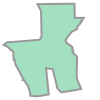

In [7]:
# Checking out the shape of the first polygon

dc_census.at[0, 'geometry']

In [4]:
# Reading in the shapefile to a geojson so that it can be submitted to the API query

data = gpd.read_file("./data/Census_Block_Groups_2010/Census_Block_Groups_2010.shp")
data.simplify(1).to_file('./data/census_block_groups.geojson', driver = "GeoJSON")

In [9]:
# Asking the query for an image during the first week of June with cloud cover at 10% or less

#https://sentinelsat.readthedocs.io/en/stable/
footprint = geojson_to_wkt(read_geojson('./data/census_block_groups.geojson'))
products = api.query(footprint,
                     date=('20190601', "20190610"),
                     platformname='Sentinel-2',
                     processinglevel = 'Level-2A',
                     cloudcoverpercentage=(0, 10))

In [10]:
# turning the results into a deodataframe

products_gdf = api.to_geodataframe(products)
products_gdf.sort_values('cloudcoverpercentage')

,title,link,link_alternative,link_icon,summary,ondemand,beginposition,endposition,ingestiondate,orbitnumber,...,processingbaseline,processinglevel,producttype,platformname,size,filename,level1cpdiidentifier,identifier,uuid,geometry
64f25189-8742-487a-a2a3-5d58ab3afcd0,S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2019-06-03T15:58:29.024Z, Instrument: MS...",false,2019-06-03 15:58:29.024,2019-06-03 15:58:29.024,2019-06-04 04:24:00.695,11706,...,02.12,Level-2A,S2MSI2A,Sentinel-2,541.32 MB,S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_2...,S2B_OPER_MSI_L1C_TL_SGS__20190603T194426_A0117...,S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_2...,64f25189-8742-487a-a2a3-5d58ab3afcd0,"MULTIPOLYGON (((-77.30109 38.73821, -76.97464 ..."


In [96]:
# downloading the file 

api.download('514fe466-6942-4f13-a073-4f141b4d855f')

Product 514fe466-6942-4f13-a073-4f141b4d855f is not online. Triggering retrieval from long term archive.


{'id': '514fe466-6942-4f13-a073-4f141b4d855f',
 'title': 'S2A_MSIL2A_20190228T160211_N0211_R097_T18SUJ_20190228T202323',
 'size': 593371452,
 'md5': '9BD88639CA8ACA6888A5C52369D6AFE3',
 'date': datetime.datetime(2019, 2, 28, 16, 2, 11, 24000),
 'footprint': 'POLYGON((-76.61975 39.73722157228598,-76.648346 39.65561522296203,-76.6998 39.50933212965372,-76.75113 39.36294670665201,-76.80228 39.216474954164894,-76.8533 39.06992315037253,-76.90442 38.923365720127606,-76.955536 38.776819435883,-76.96719 38.742980253603235,-77.30109 38.73820958831532,-77.33362 39.72680595308774,-76.61975 39.73722157228598))',
 'url': "https://scihub.copernicus.eu/dhus/odata/v1/Products('514fe466-6942-4f13-a073-4f141b4d855f')/$value",
 'Online': False,
 'Creation Date': datetime.datetime(2019, 3, 1, 2, 36, 33, 132000),
 'Ingestion Date': datetime.datetime(2019, 3, 1, 2, 17, 7, 293000),
 'path': './S2A_MSIL2A_20190228T160211_N0211_R097_T18SUJ_20190228T202323.zip',
 'downloaded_bytes': 0}

### Viewing methods

There are two viewing methods for raster files from the Sentinel API. One can either dig through the files to find the red, green, and blue images and then combine them using the rasterio library, or one can find the helpfully labeled "true color image" which has already done that work for you. For the purposes of uploading this to github, I am not uploading all of these rasterfiles, which together would make the upload too large. 

In [12]:
# Each color band is represented in a single file, 
# so to create an RGB image they all have to be read in and combined together

R10 = 'S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_20190603T202953.SAFE/GRANULE/L2A_T18SUJ_A011706_20190603T160233/IMG_DATA/R10m'
b4 = rio.open(R10+'/T18SUJ_20190603T155829_B04_10m.jp2')
b3 = rio.open(R10+'/T18SUJ_20190603T155829_B03_10m.jp2')
b2 = rio.open(R10+'/T18SUJ_20190603T155829_B02_10m.jp2')
b8 = rio.open(R10+'/T18SUJ_20190603T155829_B08_10m.jp2')


# Create an RGB image 
with rio.open('RGB.tif','w',driver='Gtiff', width=b4.width, height=b4.height, 
              count=3,crs=b4.crs,transform=b4.transform, dtype=b4.dtypes[0]) as rgb:
    rgb.write(b2.read(1),1) 
    rgb.write(b3.read(1),2) 
    rgb.write(b4.read(1),3) 
    rgb.close()

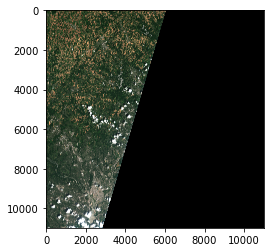

<AxesSubplot:>

In [29]:
# viewing the RGB image
rgb = rio.open(true_color_image, driver='JP2OpenJPEG') #RGB
show(rgb.read(), transform=rgb.transform)

In [15]:
# bingo, found the true color image elsewhere in the folders

true_color_image = './S2B_MSIL2A_20190603T155829_N0212_R097_T18SUJ_20190603T202953.SAFE/GRANULE/L2A_T18SUJ_A011706_20190603T160233/IMG_DATA/R10m/T18SUJ_20190603T155829_TCI_10m.jp2'
tci = rio.open(true_color_image)

Text(0, 0.5, 'Row #')

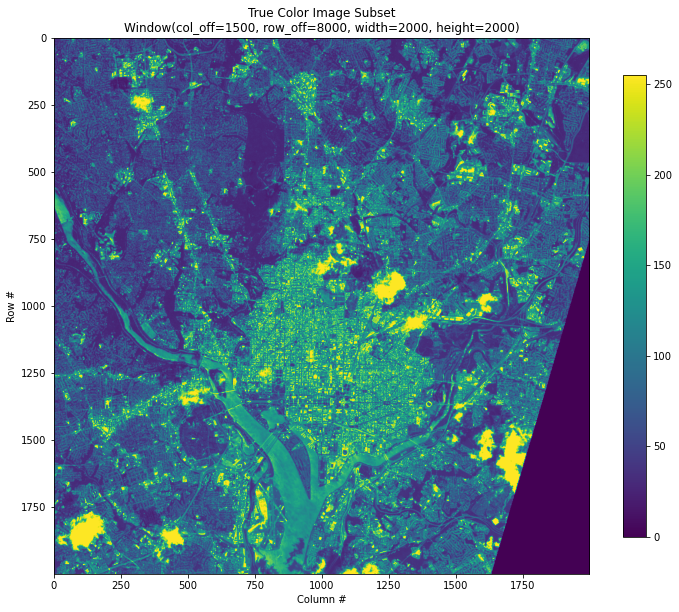

In [16]:
# Creating a window to zoom in on this image

window = rio.windows.Window(1500, 8000, 2000, 2000)

with rio.open(true_color_image) as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(12,17))
plt.imshow(subset)
plt.colorbar(shrink=0.5)
plt.title(f'True Color Image Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

### The raster file does not encompass all of DC!

As it turns out, the raster file cuts off the easternmost portions of DC. As a result, we must explore a different method of acquiring data

In [11]:
# Plotting the satellite image on top of the census tract files - it actually doesn't cover the entire city

m = folium.Map([38.9072, -77.0369], zoom_start=12)
folium.GeoJson(dc_census).add_to(m)
folium.GeoJson(products_gdf["geometry"][0]).add_to(m)
m

## Obtaining Satellite Imagery, Part 2:

The second, and ultimately more successful, attempt to gather satellite imagery involves an external tool called Google Earth Engine. Below is the Google Earth Engine code used to extract a new composite satellite image, which takes the average pixel value for each image that was produced over 6 months. Additionally, it masks clouds to give us a clearer picture. This ends up being a much better, more reliable image than the one gathered earler. The "table" referenced as a variable several times is the imported shapefile of the relevant geometry. Ultimately I pulled both DC and Chicago images (because I want to train a model on DC and test on Chicago), so I switched out that table between DC and Chicago shapefiles.

Google Earth Enginge Code Environment: https://code.earthengine.google.com/

Helpful tutorial: https://open-mrv.readthedocs.io/en/latest/image_composite_Web.html

In [ ]:
# function maskS2clouds(image) {
#   var qa = image.select('QA60');

#   // Bits 10 and 11 are clouds and cirrus, respectively.
#   var cloudBitMask = 1 << 10;
#   var cirrusBitMask = 1 << 11;

#   // Both flags should be set to zero, indicating clear conditions.
#   var mask = qa.bitwiseAnd(cloudBitMask).eq(0)
#       .and(qa.bitwiseAnd(cirrusBitMask).eq(0));

#   return image.updateMask(mask).divide(10000);
# }

# var dataset = ee.ImageCollection('COPERNICUS/S2_SR')
#                   .filterDate('2020-01-01', '2020-06-30')
#                   // Pre-filter to get less cloudy granules.
#                   .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE',10))
#                   .map(maskS2clouds)
#                   .filterBounds(table);

# var visualization = {
#   min: 0.0,
#   max: 0.3,
#   bands: ['B4', 'B3', 'B2'],
# };


# print('sentinel collection filtered',dataset);

# var composite = dataset.median().clip(table);

# Map.addLayer(composite,{bands:['B4','B3','B2'],min:0,max:0.3},
#              'Composite 2020');

# print('Sentinel composite 2020',composite);

# Map.setCenter(-77.0369, 38.9072, 12);

# Map.addLayer(table)
# Export.image.toDrive({
#   image: composite,
#   description: 's2compositeGDrive', // task name to be shown in the Tasks tab
#   fileNamePrefix: 's2composite', // filename to be saved in the Google Drive
#   scale: 10, // the spatial resolution of the image
#   region: table,
#   maxPixels: 1e13
  
# });


In [5]:
# checking out the details of the image

with rio.open('./data/s2composite.tif') as src:
    print(src.profile)

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 2343, 'height': 2274, 'count': 23, 'crs': CRS.from_epsg(4326), 'transform': Affine(8.983152841195215e-05, 0.0, -77.11982815249044,
       0.0, -8.983152841195215e-05, 38.995866483628426), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'lzw', 'interleave': 'pixel'}


### Views of DC satellite data

Text(0, 0.5, 'Row #')

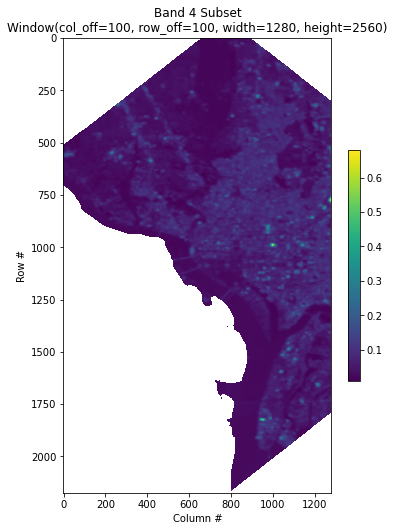

In [6]:
# Viewing a subset of the image

window = rio.windows.Window(100, 100, 1280, 2560)

with rio.open('./data/s2composite.tif') as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(6,8.5))
plt.imshow(subset)
plt.colorbar(shrink=0.5)
plt.title(f'Band 4 Subset\n{window}')
plt.xlabel('Column #')
plt.ylabel('Row #')

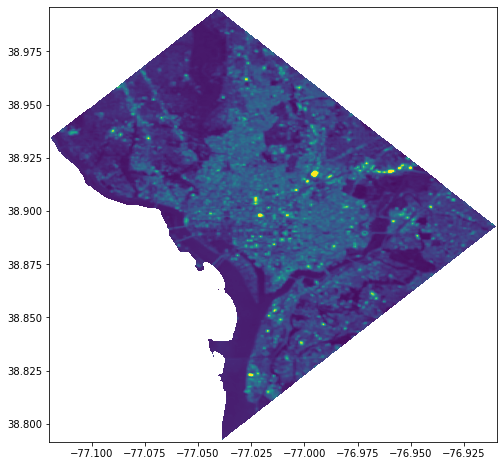

<AxesSubplot:>

In [7]:
# A different method of viewing the image, made a little brighter by restricting the pixel values

# https://towardsdatascience.com/reading-and-visualizing-geotiff-images-with-python-8dcca7a74510
from rasterio.plot import show
fp = r'./data/s2composite.tif'
img = rio.open(fp)
plt.figure(figsize=(12,8))
show(img, vmin =0, vmax = 0.3,)

In [8]:
# No. of Bands and Image resolution
print(img.count, img.height, img.width)
# Coordinate Reference System
print(img.crs)

23 2274 2343
EPSG:4326


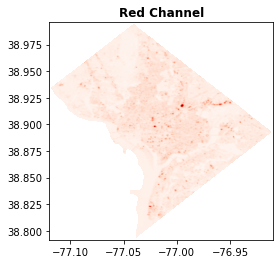

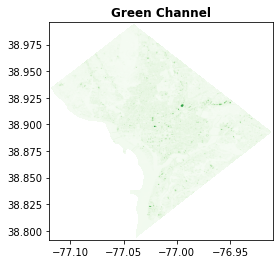

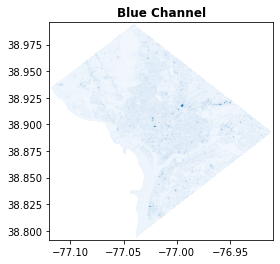

<AxesSubplot:title={'center':'Blue Channel'}>

In [9]:
# Viewing each of the R/G/B bands individually

show((img, 1), cmap='Reds', title='Red Channel')
show((img, 2), cmap='Greens', title='Green Channel')
show((img, 3), cmap='Blues', title='Blue Channel')

### View of Chicago satellite data

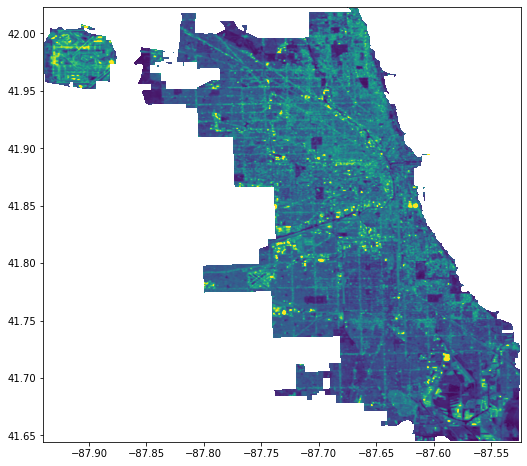

<AxesSubplot:>

In [10]:
fpc = r'./data/s2composite_chicago.tif'
imgc = rio.open(fpc)
plt.figure(figsize=(12,8))
show(imgc, vmin =0, vmax = 0.3,)

## Combining geometry and income data for DC

In order to train a model on our raster image, we need to determine what areads of DC are impoverished. Then we can create labels for our pixels, and use those as training for our model. the first step is to pull in the geometries of each census block group in DC from the extremely well-organized https://opendata.dc.gov/ . I then use the Census data wrapper to pull in the relevant information on income from the American Community Survey, which reports income information by census block group. Then I combine these two pieces of information into a single geodataframe (which is based on pandas, but is able to contain GIS properties like polygons and can perform spatial joins). I perform a similar function for the Chicago data.

In [11]:
# checking out the shapefile

dc_census.sort_values(by='GEOID').head()

,OBJECTID,TRACT,BLKGRP,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,...,OP000013,OP000014,OP000015,OP000016,H0010001,H0010002,H0010003,SHAPE_Leng,SHAPE_Area,geometry
27,28,000100,1,110010001001,1343,1323,1222,21,3,54,...,1,3,8,1,793,714,79,4339.474269,8.147889e+05,"POLYGON ((-77.06475 38.91917, -77.06383 38.918..."
28,29,000100,2,110010001002,1384,1350,1250,34,4,54,...,6,3,13,0,999,901,98,2168.618661,1.993245e+05,"POLYGON ((-77.05114 38.91062, -77.05111 38.910..."
29,30,000100,3,110010001003,1163,1150,1079,16,0,48,...,0,1,1,1,573,538,35,1874.895740,1.943297e+05,"POLYGON ((-77.05714 38.91055, -77.05714 38.910..."
0,1,000100,4,110010001004,1000,985,893,34,2,45,...,3,3,4,0,634,533,101,6569.746991,1.162392e+06,"POLYGON ((-77.05708 38.90770, -77.05707 38.907..."
1,2,000201,1,110010002011,3916,3736,2940,259,7,482,...,40,16,114,6,2,2,0,3249.765438,5.395519e+05,"POLYGON ((-77.07412 38.91259, -77.07394 38.912..."


#### Censusdata API - DC

Using the API I pulled in data from the 2019 American Community Survey for all census block groups in DC - the smallest population subset for which there is income data. I then pull out the FIPS code as an identifier. I perform some EDA on the data as well - for instance, I check out all of the values smaller than 0, and either assign them the average income of the rest of their census tract or just remove them from my analysis.

In [12]:

dc_blocks_income = censusdata.download('acs5', 2019,
                                        censusdata.censusgeo([('state', '11'), ('county', '*'), ('block group', '*')]),['B19013_001E'])
dc_blocks_income = dc_blocks_income.reset_index()
dc_blocks_income = dc_blocks_income.rename(columns={"index": "block_group_description"})
dc_blocks_income['FIPS'] = int()

# Loop over reach row and extract the 12-digit block group FIPS as an integer from its FIPS codes
for i in range(0, dc_blocks_income.shape[0]):
    dc_blocks_income['FIPS'][i] = int(''.join(re.findall(r'\d+', str(dc_blocks_income['block_group_description'][i].params()))))
dc_blocks_income.rename(columns={"B19013_001E":"median_hh_income"}, inplace=True)
dc_blocks_income.head()   

,block_group_description,median_hh_income,FIPS
0,"Block Group 2, Census Tract 88.02, District of...",32250,110010088022
1,"Block Group 3, Census Tract 88.02, District of...",72750,110010088023
2,"Block Group 3, Census Tract 96.03, District of...",35731,110010096033
3,"Block Group 1, Census Tract 96.03, District of...",43929,110010096031
4,"Block Group 2, Census Tract 96.03, District of...",72413,110010096032


In [13]:
dc_blocks_income.shape

(450, 3)

In [14]:
# obviously some funky values in there

dc_blocks_income.sort_values(by='FIPS')

,block_group_description,median_hh_income,FIPS
121,"Block Group 1, Census Tract 1, District of Col...",155938,110010001001
123,"Block Group 2, Census Tract 1, District of Col...",197773,110010001002
431,"Block Group 3, Census Tract 1, District of Col...",237109,110010001003
122,"Block Group 4, Census Tract 1, District of Col...",216513,110010001004
391,"Block Group 1, Census Tract 2.01, District of ...",-666666666,110010002011
...,...,...,...
55,"Block Group 3, Census Tract 110, District of C...",111136,110010110003
333,"Block Group 4, Census Tract 110, District of C...",110781,110010110004
265,"Block Group 1, Census Tract 111, District of C...",94667,110010111001
382,"Block Group 2, Census Tract 111, District of C...",87574,110010111002


In [15]:
# Median household income of all the census block groups
dc_blocks_income[dc_blocks_income['median_hh_income']>0]['median_hh_income'].mean()

100476.54861111111

In [16]:
# checking out the funky values, i think some of these are federal lands

dc_blocks_income[dc_blocks_income['median_hh_income']<0]

,block_group_description,median_hh_income,FIPS
35,"Block Group 2, Census Tract 108, District of C...",-666666666,110010108002
37,"Block Group 1, Census Tract 108, District of C...",-666666666,110010108001
84,"Block Group 2, Census Tract 16, District of Co...",-666666666,110010016002
117,"Block Group 1, Census Tract 49.02, District of...",-666666666,110010049021
138,"Block Group 3, Census Tract 21.02, District of...",-666666666,110010021023
156,"Block Group 3, Census Tract 76.05, District of...",-666666666,110010076053
158,"Block Group 4, Census Tract 77.03, District of...",-666666666,110010077034
167,"Block Group 2, Census Tract 78.09, District of...",-666666666,110010078092
180,"Block Group 1, Census Tract 19.01, District of...",-666666666,110010019011
189,"Block Group 1, Census Tract 62.02, District of...",-666666666,110010062021


In [17]:
# Some of these areas are completely enclosed by other census bock groups, so I thought I would replace those
# values with the average of the census tract. The rest I will drop.

for row in range(len(dc_blocks_income)):
    if dc_blocks_income['median_hh_income'][row]<0:
        tract = str(dc_blocks_income['block_group_description'][row]).split(" ")[5]
        count = 0
        sum_inc= 0
        for row2 in range(len(dc_blocks_income)):
            tract2 = str(dc_blocks_income['block_group_description'][row2]).split(" ")[5]
            if (row2 != row) & (tract == tract2):
                sum_inc += dc_blocks_income['median_hh_income'][row2]
                count +=1
        
        if count > 0:
            dc_blocks_income.at[row, 'median_hh_income']= sum_inc/count
        
dc_blocks_income[dc_blocks_income['median_hh_income']<0]

,block_group_description,median_hh_income,FIPS
35,"Block Group 2, Census Tract 108, District of C...",-333297708,110010108002
37,"Block Group 1, Census Tract 108, District of C...",-166613229,110010108001
189,"Block Group 1, Census Tract 62.02, District of...",-666666666,110010062021
391,"Block Group 1, Census Tract 2.01, District of ...",-666666666,110010002011


In [18]:
# Have to switch this to an object in order to merge it with the shape file

dc_blocks_income['FIPS_abc'] = [str(fips) for fips in dc_blocks_income['FIPS']]

In [19]:
# Merging the census polygons with the income data, and dropping the tracts that have incomes below 0

dc = pd.merge(dc_census, dc_blocks_income, left_on='GEOID', right_on='FIPS_abc')
dc= dc[dc['median_hh_income']>0] 
dc=dc.drop(columns=['block_group_description','FIPS_abc'])
dc.head()

,OBJECTID,TRACT,BLKGRP,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,...,OP000015,OP000016,H0010001,H0010002,H0010003,SHAPE_Leng,SHAPE_Area,geometry,median_hh_income,FIPS
0,1,000100,4,110010001004,1000,985,893,34,2,45,...,4,0,634,533,101,6569.746991,1.162392e+06,"POLYGON ((-77.05708 38.90770, -77.05707 38.907...",216513,110010001004
2,3,000202,1,110010002021,1196,1177,1081,25,2,56,...,6,3,604,547,57,2684.900636,1.920121e+05,"POLYGON ((-77.06568 38.91183, -77.06553 38.911...",250001,110010002021
3,4,000202,2,110010002022,813,792,749,3,1,35,...,6,0,395,366,29,1505.972723,1.355407e+05,"POLYGON ((-77.06890 38.90774, -77.06904 38.907...",217056,110010002022
4,5,000202,3,110010002023,1053,1032,954,15,1,57,...,8,1,505,455,50,1615.539725,1.544660e+05,"POLYGON ((-77.06702 38.90509, -77.06783 38.905...",185465,110010002023
5,6,000600,1,110010006001,1127,1098,983,34,3,56,...,7,2,694,657,37,2116.495226,2.148784e+05,"POLYGON ((-77.06152 38.94074, -77.06123 38.940...",109716,110010006001


In [20]:
# Keeping just the critical information
dc_subset = dc[['GEOID','median_hh_income','geometry']]
dc_subset.head()

,GEOID,median_hh_income,geometry
0,110010001004,216513,"POLYGON ((-77.05708 38.90770, -77.05707 38.907..."
2,110010002021,250001,"POLYGON ((-77.06568 38.91183, -77.06553 38.911..."
3,110010002022,217056,"POLYGON ((-77.06890 38.90774, -77.06904 38.907..."
4,110010002023,185465,"POLYGON ((-77.06702 38.90509, -77.06783 38.905..."
5,110010006001,109716,"POLYGON ((-77.06152 38.94074, -77.06123 38.940..."


In [21]:
dc_subset=dc_subset.set_index("GEOID")

In [22]:
# reading the block groups (unsimplified version) into a geojson to plot

data = gpd.read_file("./data/Census_Block_Groups_2010/Census_Block_Groups_2010.shp")
data.to_file('./data/census_block_groups_unsimplified.geojson', driver = "GeoJSON")

<AxesSubplot:>

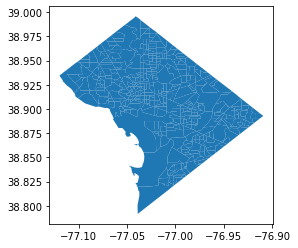

In [23]:
# plotting the block groups

gdf = gpd.read_file('./data/census_block_groups_unsimplified.geojson')
gdf.plot()

#### Censusdata API - Chicago

I perform a very similar function here for Chicago data. The key difference is that I can only pull census data and gemetries for all of the census block groups in Cook County - not just Chicago. Consequently, I had to download the boundary of Chicago (that and all other geometric information can be found here - https://data.cityofchicago.org/) and filter the census block groups using a spatial join to determine all of the relevant polygons "within" the Chicago boundary.

In [24]:
chicago_blocks_income = censusdata.download('acs5', 2019,
                                        censusdata.censusgeo([('state', '17'), ('county', '031'), ('block group', '*')]),['B19013_001E'])
chicago_blocks_income = chicago_blocks_income.reset_index()
chicago_blocks_income = chicago_blocks_income.rename(columns={"index": "block_group_description"})
chicago_blocks_income['FIPS'] = int()

# Loop over reach row and extract the 12-digit block group FIPS as an integer from its FIPS codes
for i in range(0, chicago_blocks_income.shape[0]):
    chicago_blocks_income['FIPS'][i] = int(''.join(re.findall(r'\d+', str(chicago_blocks_income['block_group_description'][i].params()))))
chicago_blocks_income.rename(columns={"B19013_001E":"median_hh_income"}, inplace=True)
chicago_blocks_income.head()   

,block_group_description,median_hh_income,FIPS
0,"Block Group 1, Census Tract 8089, Cook County,...",187500,170318089001
1,"Block Group 3, Census Tract 8089, Cook County,...",127019,170318089003
2,"Block Group 1, Census Tract 8098, Cook County,...",83750,170318098001
3,"Block Group 3, Census Tract 8101, Cook County,...",87115,170318101003
4,"Block Group 4, Census Tract 8101, Cook County,...",80083,170318101004


In [25]:
# Number of census block groups in Cook County
chicago_blocks_income.shape

(3993, 3)

In [26]:
# Median household income of all the census block groups
chicago_blocks_income[chicago_blocks_income['median_hh_income']>0]['median_hh_income'].mean()

72749.18422431865

In [27]:
# Checking out the block groups below 0
chicago_blocks_income[chicago_blocks_income['median_hh_income']<0]

,block_group_description,median_hh_income,FIPS
9,"Block Group 1, Census Tract 8093, Cook County,...",-666666666,170318093001
36,"Block Group 2, Census Tract 813, Cook County, ...",-666666666,170310813002
53,"Block Group 1, Census Tract 7502, Cook County,...",-666666666,170317502001
78,"Block Group 5, Census Tract 1101, Cook County,...",-666666666,170311101005
100,"Block Group 4, Census Tract 8255.05, Cook Coun...",-666666666,170318255054
...,...,...,...
3811,"Block Group 2, Census Tract 8382, Cook County,...",-666666666,170318382002
3832,"Block Group 4, Census Tract 207.02, Cook Count...",-666666666,170310207024
3891,"Block Group 1, Census Tract 4212, Cook County,...",-666666666,170314212001
3903,"Block Group 3, Census Tract 4908, Cook County,...",-666666666,170314908003


In [28]:
# Converting the id column to a string in order to join in to the string in the geometry table
chicago_blocks_income['FIPS_abc'] = [str(fips) for fips in chicago_blocks_income['FIPS']]

In [40]:
# Converting the census tract to a geojson to plot it 
chicago_census = gpd.read_file("./data/Chicago_Census_2010/PVS_20_v1_bg_17031.shp")
chicago_census.to_file('./data/census_block_groups_chicago.geojson', driver = "GeoJSON")

In [44]:
chicago_census.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,BLKGRPID,CHNG_TYPE,EFF_DATE,BGTYP,RELATE,JUSTIFY,VINTAGE,geometry
0,17,031,010100,1,170310101001,None,None,None,None,None,None,"POLYGON ((-87.67072 42.02138, -87.67072 42.021..."
1,17,031,010100,2,170310101002,None,None,None,None,None,None,"POLYGON ((-87.67720 42.02294, -87.67628 42.022..."
2,17,031,010100,3,170310101003,None,None,None,None,None,None,"POLYGON ((-87.67265 42.02300, -87.67188 42.023..."
3,17,031,010300,2,170310103002,None,None,None,None,None,None,"POLYGON ((-87.67133 42.01937, -87.67121 42.019..."
4,17,031,030604,2,170310306042,None,None,None,None,None,None,"POLYGON ((-87.65532 41.98809, -87.65529 41.988..."


<AxesSubplot:>

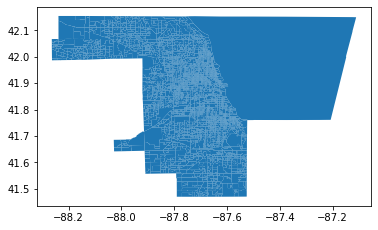

In [42]:
# Plotting the geojson
c = gpd.read_file('./data/census_block_groups_chicago.geojson')
c.plot()

In [45]:
# Merging the census polygons with the income data, and dropping the tracts that have incomes below 0

chicago = pd.merge(chicago_census, chicago_blocks_income, left_on='BLKGRPID', right_on='FIPS_abc')
chicago= chicago[chicago['median_hh_income']>0] 
chicago=chicago.drop(columns=['block_group_description','FIPS_abc'])
chicago.head()

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,BLKGRPID,CHNG_TYPE,EFF_DATE,BGTYP,RELATE,JUSTIFY,VINTAGE,geometry,median_hh_income,FIPS
1,17,031,010100,2,170310101002,None,None,None,None,None,None,"POLYGON ((-87.67720 42.02294, -87.67628 42.022...",21827,170310101002
2,17,031,010100,3,170310101003,None,None,None,None,None,None,"POLYGON ((-87.67265 42.02300, -87.67188 42.023...",54297,170310101003
3,17,031,010300,2,170310103002,None,None,None,None,None,None,"POLYGON ((-87.67133 42.01937, -87.67121 42.019...",51133,170310103002
4,17,031,030604,2,170310306042,None,None,None,None,None,None,"POLYGON ((-87.65532 41.98809, -87.65529 41.988...",62935,170310306042
5,17,031,030702,1,170310307021,None,None,None,None,None,None,"POLYGON ((-87.65511 41.98072, -87.65409 41.980...",64792,170310307021


In [46]:
# Keeping just the critical information
chicago_subset = chicago[['BLKGRPID','median_hh_income','geometry']]
chicago_subset.head()

,BLKGRPID,median_hh_income,geometry
1,170310101002,21827,"POLYGON ((-87.67720 42.02294, -87.67628 42.022..."
2,170310101003,54297,"POLYGON ((-87.67265 42.02300, -87.67188 42.023..."
3,170310103002,51133,"POLYGON ((-87.67133 42.01937, -87.67121 42.019..."
4,170310306042,62935,"POLYGON ((-87.65532 41.98809, -87.65529 41.988..."
5,170310307021,64792,"POLYGON ((-87.65511 41.98072, -87.65409 41.980..."


In [47]:
# Reading in the boundary of the city of Chicago
chicago_boundary = gpd.read_file("./data/Boundaries - City/geo_export_cf8dc551-a25f-474a-8189-d517116c440a.shp")
chicago_boundary

,name,objectid,shape_area,shape_len,geometry
0,CHICAGO,1.0,6.450277e+09,845282.931362,"MULTIPOLYGON (((-87.93514 42.00089, -87.93521 ..."


<AxesSubplot:>

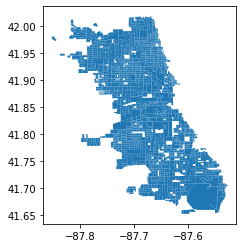

In [48]:
# Performing the spatial join so that only the census block groups within the Chicago city
# are counted, instead of the whole county
chicago_cbg = gpd.sjoin(chicago_subset, chicago_boundary, how="inner", op='within')
chicago_cbg.plot()

## Plot of Income Data

Using the combined census geometry data, I plotted both the DC and Chicago income levels to get a sense of where the highest and lowest income levels were located in each city. The color depicts the median household income for each block group.

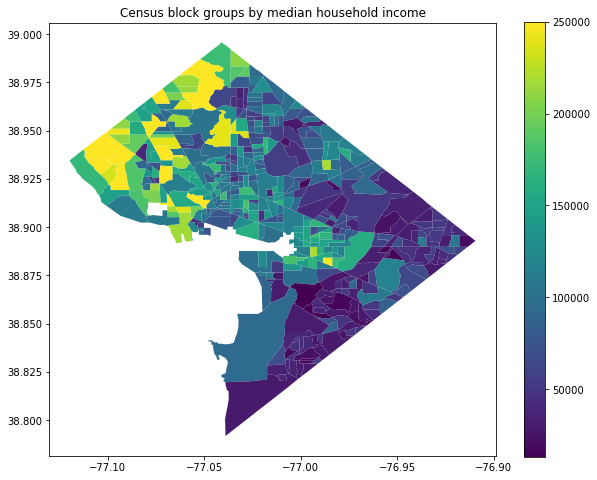

In [52]:
# Plot of income data in DC
test = dc_subset
test['area'] = test.area

test.plot("median_hh_income",legend=True,figsize= (10,8))
plt.title("Census block groups by median household income")
plt.show()

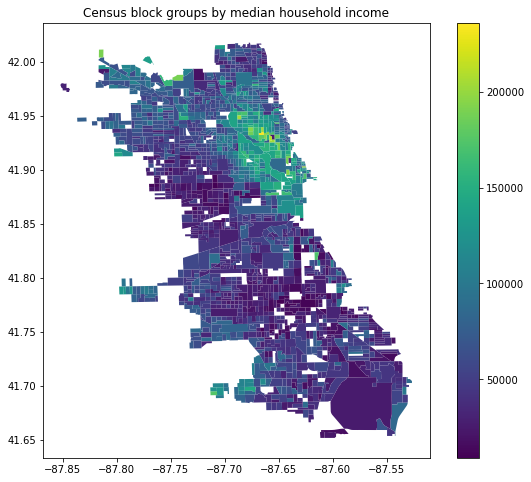

In [53]:
# Plot of income data in Chicago
test_chi = chicago_cbg.set_index("BLKGRPID")
test_chi['area'] = test_chi.area

test_chi.plot("median_hh_income",legend=True,figsize= (10,8))
plt.title("Census block groups by median household income")
plt.show()

## Plotting Income Data on the Satellite Image

The next stage of the project was to be able to combine the census income data and the satellite imagery onto the same plot - partially for the purposes of visualization, but also partially because we needed to make sure that the two pieces of information lined up appropriately with their resspective coordinates, etc. Initially, I plotted all of the block groups on top of the DC satellite image, and then I narrowed that down to just the low-income areas (adjusted by eac city's cost of living above the national average).

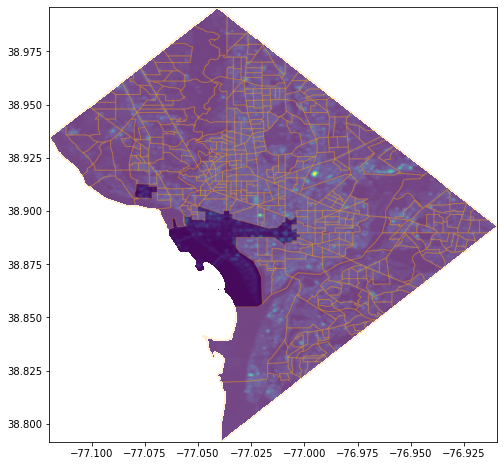

In [55]:
# Plotting all the block groups (minus the ones i dropped)
from rasterio.plot import show
fp = r'./data/s2composite.tif'
img = rio.open(fp)

fig, ax = plt.subplots(figsize=(10, 8))
show(img, ax=ax)
dc_subset.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.25,color='white', edgecolor= 'orange')

plt.show();

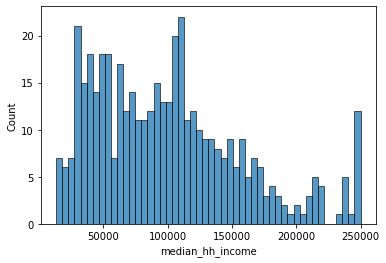

In [56]:
# Checking out the distribution of income
import seaborn as sns

sns.histplot(dc_subset['median_hh_income'], bins = 50);

In [57]:
# The federal poverty level is just about 25,000 per 4-person household

#https://www.dcfpi.org/all/income-inequality-dc-highest-country/
dc_poverty = dc_subset[dc_subset['median_hh_income']<25000]

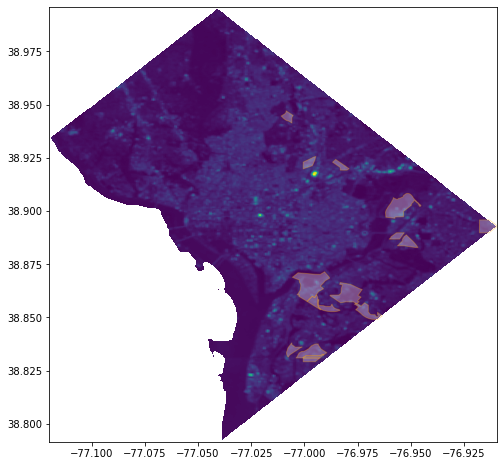

In [59]:
# Census Block Groups below the federal poverty level

from rasterio.plot import show
fp = r'./data/s2composite.tif'
img = rio.open(fp)

fig, ax = plt.subplots(figsize=(10, 8))
show(img, ax=ax)
dc_poverty.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')

plt.show();

In [60]:
# created a new dataframe of just areas below the new poverty + cost of living line
dc_poverty_col = dc_subset[dc_subset['median_hh_income']<34750]

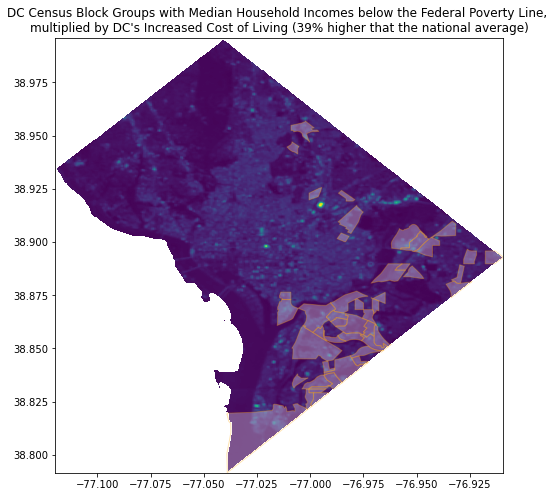

In [61]:
# Census Block Groups with Median Household Incomes below the Federal Poverty Line, 
# multiplied by DC's Increased Cost of Living (39% higher that the national average)

from rasterio.plot import show
fp = r'./data/s2composite.tif'
img = rio.open(fp)

fig, ax = plt.subplots(figsize=(10, 8))
show(img, ax=ax)
dc_poverty_col.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')
plt.title("DC Census Block Groups with Median Household Incomes below the Federal Poverty Line, \nmultiplied by DC's Increased Cost of Living (39% higher that the national average)")
plt.show();

In [62]:
# created a new dataframe of just areas below the new poverty + cost of living line
chi_poverty_col = chicago_cbg[chicago_cbg['median_hh_income']<30750]

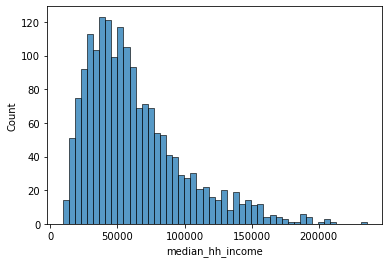

In [63]:
# Checking out the distribution of income in Chicago
sns.histplot(chicago_cbg['median_hh_income'], bins = 50);

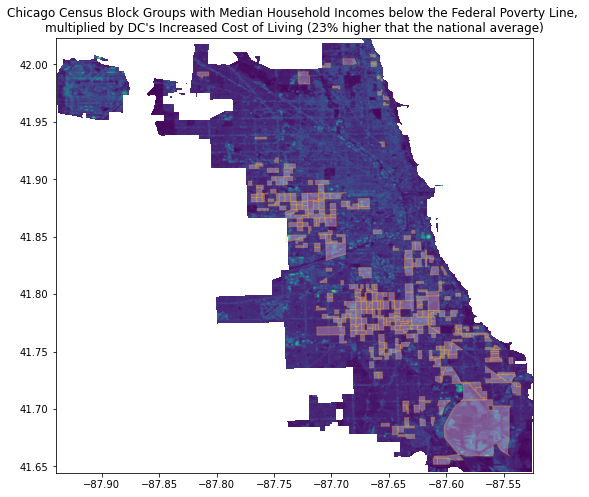

In [64]:
# Census Block Groups with Median Household Incomes below the Federal Poverty Line, 
# multiplied by Chicago's Increased Cost of Living (23% higher that the national average)

from rasterio.plot import show
fpc = r'./data/s2composite_chicago.tif'
imgc = rio.open(fpc)

fig, ax = plt.subplots(figsize=(10, 8))
show(imgc, ax=ax)
chi_poverty_col.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')
plt.title("Chicago Census Block Groups with Median Household Incomes below the Federal Poverty Line, \nmultiplied by DC's Increased Cost of Living (23% higher that the national average)")
plt.show();

## Rasterizing the shapefiles

In order to train our model, we need to create labels of each pixel in DC. To do this, we must recast the income data in the shapefile as a raster image, so that it can be used as that label. Pixels inside of low-income zones are cast as "255" (white) and everything else is cast as "0" (black). The new file is stored as a 'tif', the same as a raster image. The same process was used for the Chicago data.

In [65]:
# https://towardsdatascience.com/neural-network-for-satellite-data-classification-using-tensorflow-in-python-a13bcf38f3e1
# Rasterizing DC's income data to use as a label in the model

src = rio.open('./data/s2composite.tif')

    
image = rio.features.rasterize(
            ((g, 255) for g in dc_poverty_col['geometry']),
            out_shape=src.shape,
            transform=src.transform)

with rio.open(
        './data/income_labels.tif', 'w',
        driver='GTiff',
        dtype=rio.uint8,
        count=1,
        width=src.width,
        height=src.height) as dst:
    dst.write(image, indexes=1)

In [66]:
src = rio.open('./data/s2composite_chicago.tif')

    
image = rio.features.rasterize(
            ((g, 255) for g in chi_poverty_col['geometry']),
            out_shape=src.shape,
            transform=src.transform)

with rio.open(
        './data/income_labels_chi.tif', 'w',
        driver='GTiff',
        dtype=rio.uint8,
        count=1,
        width=src.width,
        height=src.height) as dst:
    dst.write(image, indexes=1)

## Preprocessing 

In order to have data to use in the model, we have to read the raster images as numpy arrays. The easiest way to do this is with the pysrgis library, which also allows us to change the data into a form that can be read into a neural network while maintaining the latitude and longitude information. However, it is more used to dealing with Landsat imagery, which displays color values along the normal 0 to 255 range. As a result it converts floats to integers but rounding.  However, the Sentinel2 satellite stores each color as values between 0 and 1.1 or so. Therefore, we must multiply all of those values by a large value so that the decimal places can be captured when the value is converted to an integer. Finally, the labels are dvided by 255 so that all values will be 0 or 1. 

In [67]:
# Storing each part of the model as an independent array
ds1, features_dc = raster.read('./data/s2composite.tif', bands='all')
ds2, labels_dc = raster.read('./data/income_labels.tif', bands=1)
ds3, features_chi = raster.read('./data/s2composite_chicago.tif', bands='all')
ds4, labels_chi = raster.read('./data/income_labels_chi.tif', bands=1)

In [68]:
# Double checking that the shapes of these arrays match
print(features_dc.shape)
print(labels_dc.shape)
print(features_chi.shape)
print(labels_chi.shape)

(23, 2274, 2343)
(2274, 2343)
(23, 4215, 4631)
(4215, 4631)


In [69]:
# Chnaging the shape of these arrays so that we can incoporate them into a neural network
# We also multiply the feature values here so that the small values are not lost.
features_dc_cd = changeDimension(features_dc*100000)
labels_dc_cd = changeDimension (labels_dc)
features_chi_cd= changeDimension(features_chi*100000)
labels_chi_cd = changeDimension (labels_chi)
nBands = features_dc_cd.shape[1]

print("DC multispectral image shape: ", features_dc_cd.shape)
print("DC binary income image shape: ", labels_dc_cd.shape)
print("Chicago multispectral image shape: ", features_chi_cd.shape)
print("Chicago binary income image shape: ", labels_chi_cd.shape)

DC multispectral image shape:  (5327982, 23)
DC binary income image shape:  (5327982,)
Chicago multispectral image shape:  (19519665, 23)
Chicago binary income image shape:  (19519665,)


In [70]:
# Normalizing all of the labels so that they are either 0 or 1
labels_dc_cd = labels_dc_cd/255
labels_chi_cd = labels_chi_cd/255

## Modeling: Training a model on the DC data and testing on the Chicago data

We ran two models on the DC satellite imagery. Both were classification neural nets with the same amount of layers, neurons, and activation functions. However, the first model was run on the regular data, which contains, proportionally, very few pixels labeled as "1". These imbalanced classes give us a baseline score of 94.3%. Our first model didn't do significantly better than baseline, but considering how high our baseline was, a whole percentage point semed like something to celebrate. In order to combat some of this imbalance, we ran a second model and employed a corrective measure to oversample the minorty class using the Imbalanced Classes library. This model gave us below-chance accuracy, but the recall score was quite high. 

In [251]:
# Splitting the data into train and test groups
X_train, X_test, y_train, y_test = train_test_split(features_dc_cd, labels_dc_cd, test_size=0.4, random_state=23, stratify=labels_dc_cd)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


(3196789, 23)
(3196789,)
(2131193, 23)
(2131193,)


In [252]:
# Normalizing the data - dividing by the same number we multiplied each by earlier
X_train = X_train / 100000.0
X_test = X_test / 100000.0
features_chi_cd = features_chi_cd / 100000.0

# Reshaping the data
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
features_chi_cd = features_chi_cd.reshape((features_chi_cd.shape[0], 1, features_chi_cd.shape[1]))

# Print the shape of reshaped data
print(X_train.shape, X_test.shape, 
      features_chi_cd.shape
     )

(3196789, 1, 23) (2131193, 1, 23) (19519665, 1, 23)


In [259]:
# Defining the parameters of the model
model = keras.Sequential([
    keras.layers.Flatten(input_shape=(1, nBands)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')])

# Defining the accuracy metrics and parameters
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Defining the early stop (which kills the model if it runs too long without improvement,
# and also saves the best weights
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto', restore_best_weights=True)

# Fitting the model
model.fit(x = X_train, y= y_train, validation_data = (X_test,y_test), epochs=10, callbacks=early_stop)

Epoch 1/10
99900/99900 [==============================] - 165s 2ms/step - loss: 915507443.4168 - accuracy: 0.9438 - val_loss: 0.1506 - val_accuracy: 0.9469
Epoch 2/10
99900/99900 [==============================] - 167s 2ms/step - loss: 0.1511 - accuracy: 0.9466 - val_loss: 0.1459 - val_accuracy: 0.9476
Epoch 3/10
99900/99900 [==============================] - 178s 2ms/step - loss: 0.1463 - accuracy: 0.9477 - val_loss: 0.1450 - val_accuracy: 0.9478
Epoch 4/10
99900/99900 [==============================] - 176s 2ms/step - loss: 0.1437 - accuracy: 0.9482 - val_loss: 0.1429 - val_accuracy: 0.9479
Epoch 5/10
99900/99900 [==============================] - 166s 2ms/step - loss: 0.1415 - accuracy: 0.9488 - val_loss: 0.1377 - val_accuracy: 0.9504
Epoch 6/10
99900/99900 [==============================] - 181s 2ms/step - loss: 0.1373 - accuracy: 0.9506 - val_loss: 0.1325 - val_accuracy: 0.9524
Epoch 7/10
99900/99900 [==============================] - 184s 2ms/step - loss: 0.1350 - accuracy: 0.951

In [135]:
# Baseline model
1-np.mean(labels_dc_cd)

0.9430146348092017

In [265]:
# Predicting on the test data 
y_test_predicted = model.predict(X_test)

# Calculate and display the error metrics
y_test_predicted = (y_test_predicted>0.5).astype(int)
confusion_matrix_model1 = confusion_matrix(y_test, y_test_predicted)
pScore = precision_score(y_test, y_test_predicted)
rScore = recall_score(y_test, y_test_predicted)

print("Confusion matrix: for >200,000 nodes\n", confusion_matrix_model1)
print(f"\nP-Score: {pScore}, R-Score: {rScore}")

Confusion matrix: for >200,000 nodes
 [[1992296   17450]
 [  83690   37757]]

P-Score: 0.6839168945966997, R-Score: 0.31089281744299985


In [262]:
# Evaluating the model 
model.evaluate(X_test, y_test, verbose=1)

66600/66600 [==============================] - 55s 826us/step - loss: 0.1307 - accuracy: 0.9525


[0.1306518316268921, 0.9525430202484131]

In [168]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_dc_cd, labels_dc_cd, test_size=0.4, random_state=23, stratify=labels_dc_cd)

# Instantiating the oversampling instance
oversample = RandomOverSampler(sampling_strategy='minority')

# Creating new X and y trains with an evenly divided class by over sampling from the pixels in
# areas with poverty
X_train_over, y_train_over = oversample.fit_resample(X_train, y_train)

# Normalizing the data
X_train_over = X_train_over / 100000
X_test = X_test / 100000

# Reshaping the data
X_train_over = X_train_over.reshape((X_train_over.shape[0], 1, X_train_over.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Print the shape of reshaped data
print(X_train_over.shape, X_test.shape, 
     )

(6029238, 1, 23) (2131193, 1, 23)


In [169]:
# Evenly balanced classes in the training data
np.mean(y_train_over)

0.5

In [273]:
# Defining the parameters of the model
model2 = keras.Sequential([
    keras.layers.Flatten(input_shape=(1, nBands)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')])

# Defining the accuracy metrics and parameters
model2.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Defining the early stop (which kills the model if it runs too long without improvement,
# and also saves the best weights
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto', restore_best_weights=True)

# Runing the model
model2.fit(x=X_train_over, y=y_train_over, validation_data=((X_test,y_test)), epochs=10, callbacks=early_stop)

Epoch 1/10
188414/188414 [==============================] - 318s 2ms/step - loss: 74322395947.1701 - accuracy: 0.8209 - val_loss: 0.2712 - val_accuracy: 0.8892
Epoch 2/10
188414/188414 [==============================] - 338s 2ms/step - loss: 236356591.4564 - accuracy: 0.8357 - val_loss: 0.2545 - val_accuracy: 0.8935
Epoch 3/10
188414/188414 [==============================] - 324s 2ms/step - loss: 0.3352 - accuracy: 0.8397 - val_loss: 0.8938 - val_accuracy: 0.6282
Epoch 4/10
188414/188414 [==============================] - 325s 2ms/step - loss: 5624410207.0788 - accuracy: 0.8408 - val_loss: 5.7474 - val_accuracy: 0.6282
Epoch 5/10
188414/188414 [==============================] - 329s 2ms/step - loss: 8663377608.4471 - accuracy: 0.8420 - val_loss: 0.5717 - val_accuracy: 0.9303
Epoch 6/10
188414/188414 [==============================] - 345s 2ms/step - loss: 0.3209 - accuracy: 0.8442 - val_loss: 1.8222 - val_accuracy: 0.9407
Epoch 7/10
188414/188414 [==============================] - 256s

In [274]:
# Evaluating on the new model
model2.evaluate(X_test, y_test, verbose=1)

66600/66600 [==============================] - 57s 857us/step - loss: 0.2545 - accuracy: 0.8935s - loss: 0


[0.25448617339134216, 0.8935070633888245]

In [278]:
# Predicting on the test data 
y_test_predicted2 = model2.predict(X_test)

# Calculate and display the error metrics
y_test_predicted2 = (y_test_predicted2>0.5).astype(int)
confusion_matrix_model2 = confusion_matrix(y_test, y_test_predicted2)
pScore = precision_score(y_test, y_test_predicted2)
rScore = recall_score(y_test, y_test_predicted2)

print("Confusion matrix: for >200,000 nodes\n", confusion_matrix_model2)
print(f"\nP-Score: {pScore}, R-Score: {rScore}")

Confusion matrix: for >200,000 nodes
 [[1884463  125283]
 [ 101674   19773]]

P-Score: 0.13631287227001984, R-Score: 0.16281176150913568


## Prediction of Chicago Poverty based on DC Model

In this section we used the model built on the DC data to predict on the Chicago satellite data using both models. The first model is not very specific, and clearly shows some funky patterns. It correctly predicts some of the larger chunks of poverty on the far south side, but misses all of the west side and mid-South side poverty entirely. 

In [267]:
# Predict on the first model
predicted = model.predict(features_chi_cd)

#Export raster
prediction = np.reshape(predicted, (ds3.RasterYSize, ds3.RasterXSize))
outFile = './data/chicago_income_predicted.tif'
raster.export(prediction, ds3, filename=outFile, dtype='float')

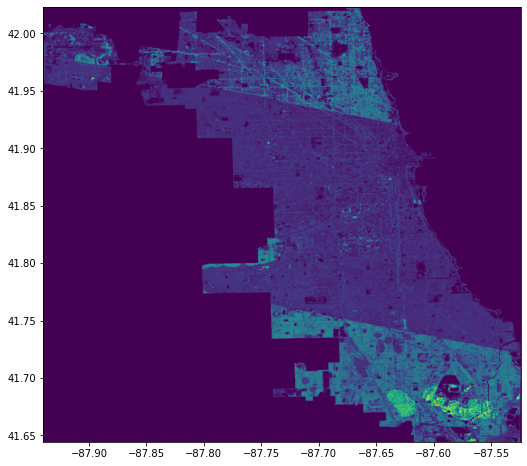

<AxesSubplot:>

In [271]:
# Reading in the predictions of the first model
fpp = r'./data/chicago_income_predicted.tif'
imgp = rio.open(fpp)
plt.figure(figsize=(12,8))
show(imgp, )

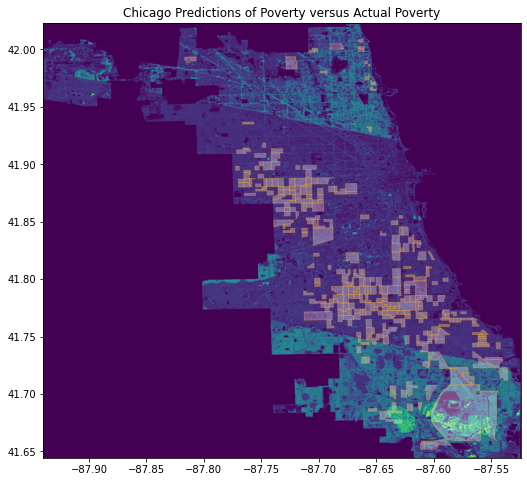

In [272]:
# Viewing the predictions of the first model in comparison to the actual impoverished areas
fig, ax = plt.subplots(figsize=(10, 8))
show(imgp, ax=ax)
chi_poverty_col.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')
plt.title("Chicago Predictions of Poverty versus Actual Poverty")
plt.show();

In [ ]:
# Predict on the second model
predicted2 = model2.predict(features_chi_cd)

#Export raster
prediction2 = np.reshape(predicted2, (ds3.RasterYSize, ds3.RasterXSize))
outFile = './data/chicago_income_predicted2.tif'
raster.export(prediction2, ds3, filename=outFile, dtype='float')

## Training a model on the Chicago data and testing on the DC data

Training initially on the unadjusted data and secondly on the artifically adjusted data. Initially I thought this model would do better, since there is more Chicago data than DC data (it's a bigger city). The first model initially got stuck at what was probably a local minimum and the second model (with artificially enhanced classes) does not improve beyond baseline. After I added several dropout layers it was able to achice a few tenths of a percentage point above baseline, but the actually predictions seem to be predicting water vapor in DC rather than wealth, with a terrible recall score. The second model doesn't predict any poverty areas.

In [279]:
# Baseline model
1-np.mean(labels_chi_cd)

0.9320506781238305

In [86]:
# Splitting the data into train and test groups
X_train, X_test, y_train, y_test = train_test_split(features_chi_cd, labels_chi_cd, test_size=0.4, random_state=23, stratify=labels_chi_cd)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(11711799, 23)
(11711799,)
(7807866, 23)
(7807866,)


In [87]:
# Normalizing the data - dividing by the same number we multiplied each by earlier
X_train = X_train / 100000.0
X_test = X_test / 100000.0
features_dc_cd = features_dc_cd / 100000.0

# Reshaping the data
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))
features_dc_cd = features_dc_cd.reshape((features_dc_cd.shape[0], 1, features_dc_cd.shape[1]))

# Print the shape of reshaped data
print(X_train.shape, X_test.shape, 
      features_dc_cd.shape
     )

(11711799, 1, 23) (7807866, 1, 23) (5327982, 1, 23)


In [88]:
# Defining the parameters of the model
model_chi = keras.Sequential([
    keras.layers.Flatten(input_shape=(1, nBands)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(1, activation='sigmoid')])

# Defining the accuracy metrics and parameters
model_chi.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Defining the early stop (which kills the model if it runs too long without improvement,
# and also saves the best weights
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto', restore_best_weights=True)

# Fitting the model
model_chi.fit(x = X_train, y= y_train, validation_data = (X_test,y_test), epochs=10, callbacks=early_stop)

Epoch 1/10
365994/365994 [==============================] - 964s 3ms/step - loss: 1309714649.0483 - accuracy: 0.9322 - val_loss: 0.1774 - val_accuracy: 0.9333
Epoch 2/10
365994/365994 [==============================] - 946s 3ms/step - loss: 732390133.1434 - accuracy: 0.9336 - val_loss: 0.1724 - val_accuracy: 0.9350
Epoch 3/10
365994/365994 [==============================] - 946s 3ms/step - loss: 5951605873.3480 - accuracy: 0.9344 - val_loss: 0.1833 - val_accuracy: 0.9308
Epoch 4/10
365994/365994 [==============================] - 941s 3ms/step - loss: 657452360.5193 - accuracy: 0.9349 - val_loss: 0.1686 - val_accuracy: 0.9346
Epoch 5/10
365994/365994 [==============================] - 761s 2ms/step - loss: 1639511442.0187 - accuracy: 0.9350 - val_loss: 0.1718 - val_accuracy: 0.9346
Epoch 6/10
365994/365994 [==============================] - 558s 2ms/step - loss: 6760175382.7775 - accuracy: 0.9350 - val_loss: 0.1670 - val_accuracy: 0.9344
Epoch 7/10
365994/365994 [======================

In [89]:
# Predicting on the test data 
y_test_predicted_chi = model_chi.predict(X_test)

# Calculate and display the error metrics
y_test_predicted_chi = (y_test_predicted_chi>0.5).astype(int)
confusion_matrix_model_chi1 = confusion_matrix(y_test, y_test_predicted_chi)
pScore = precision_score(y_test, y_test_predicted_chi)
rScore = recall_score(y_test, y_test_predicted_chi)

print("Confusion matrix: for >200,000 nodes\n", confusion_matrix_model_chi1)
print(f"\nP-Score: {pScore}, R-Score: {rScore}")

Confusion matrix: for >200,000 nodes
 [[7268274    9053]
 [ 500112   30427]]

P-Score: 0.770694022289767, R-Score: 0.057351108966541574


In [90]:
# Evaluating the model 
model_chi.evaluate(X_test, y_test, verbose=1)

243996/243996 [==============================] - 239s 979us/step - loss: 0.1727 - accuracy: 0.9348


[0.1727450042963028, 0.9347882270812988]

In [91]:
# Predict on the first model
predicted_dc = model_chi.predict(features_dc_cd)

#Export raster
prediction_dc = np.reshape(predicted_dc, (ds1.RasterYSize, ds1.RasterXSize))
outFile = './data/dc_income_predicted.tif'
raster.export(prediction_dc, ds1, filename=outFile, dtype='float')

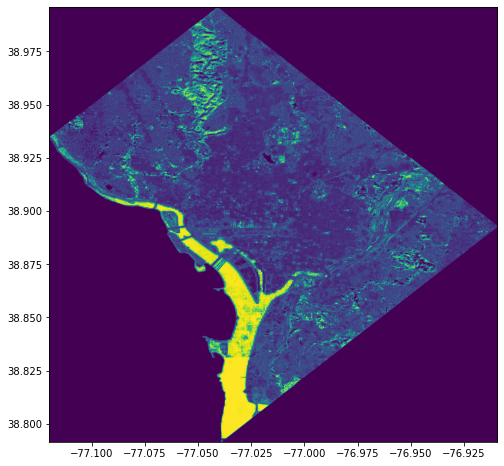

<AxesSubplot:>

In [92]:
# Reading in the predictions of the first model
fpp = r'./data/dc_income_predicted.tif'
imgp = rio.open(fpp)
plt.figure(figsize=(12,8))
show(imgp, )

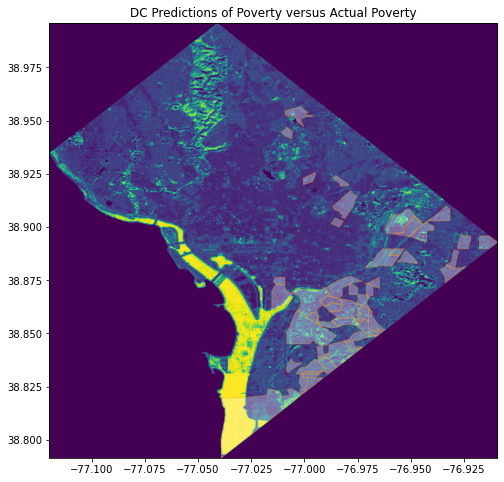

In [93]:
# Viewing the predictions of the first model in comparison to the actual impoverished areas
fig, ax = plt.subplots(figsize=(10, 8))
show(imgp, ax=ax)
dc_poverty_col.plot("median_hh_income",ax=ax, legend=True,figsize= (10,8), 
               vmin =0, vmax = 0.3,alpha=0.3,color='white', edgecolor= 'orange')
plt.title("DC Predictions of Poverty versus Actual Poverty")
plt.show();

In [73]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_chi_cd, labels_chi_cd, test_size=0.4, random_state=23, stratify=labels_chi_cd)

# Instantiating the oversampling instance
oversample = RandomOverSampler(sampling_strategy=0.3)

# Creating new X and y trains with an evenly divided class by over sampling from the pixels in
# areas with poverty
X_train_over, y_train_over = oversample.fit_resample(X_train, y_train)

# Normalizing the data
X_train_over = X_train_over / 100000
X_test = X_test / 100000

# Reshaping the data
X_train_over = X_train_over.reshape((X_train_over.shape[0], 1, X_train_over.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Print the shape of reshaped data
print(X_train_over.shape, X_test.shape, 
     )

(14190787, 1, 23) (7807866, 1, 23)


In [74]:
# Defining the parameters of the model
model2_chi = keras.Sequential([
    keras.layers.Flatten(input_shape=(1, nBands)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1, activation='sigmoid')])

# Defining the accuracy metrics and parameters
model2_chi.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

# Defining the early stop (which kills the model if it runs too long without improvement,
# and also saves the best weights
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto', restore_best_weights=True)

# Runing the model
model2_chi.fit(x=X_train_over, y=y_train_over, validation_data=((X_test,y_test)), epochs=10, callbacks=early_stop)

Epoch 1/10
443463/443463 [==============================] - 722s 2ms/step - loss: 295122457.9440 - accuracy: 0.8034 - val_loss: 0.2198 - val_accuracy: 0.8712
Epoch 2/10
443463/443463 [==============================] - 673s 2ms/step - loss: 341549415.7772 - accuracy: 0.8330 - val_loss: 0.2315 - val_accuracy: 0.8730
Epoch 3/10
443463/443463 [==============================] - 668s 2ms/step - loss: 124987748.3255 - accuracy: 0.8366 - val_loss: 0.2122 - val_accuracy: 0.8782
Epoch 4/10
443463/443463 [==============================] - 740s 2ms/step - loss: 538822846.7086 - accuracy: 0.8384 - val_loss: 0.2130 - val_accuracy: 0.8787
Epoch 5/10
443463/443463 [==============================] - 870s 2ms/step - loss: 640779099.7940 - accuracy: 0.8396 - val_loss: 0.2021 - val_accuracy: 0.8929
Epoch 6/10
443463/443463 [==============================] - 776s 2ms/step - loss: 65364763.2965 - accuracy: 0.8404 - val_loss: 0.2134 - val_accuracy: 0.8833
Epoch 7/10
443463/443463 [===========================

In [75]:
# Evaluating on the new model
model2_chi.evaluate(X_test, y_test, verbose=1)

243996/243996 [==============================] - 224s 915us/step - loss: 0.2021 - accuracy: 0.8929


[0.20211787521839142, 0.8929181098937988]

In [77]:
# Predict for test data 
y_test_predicted2_chi = model2_chi.predict(X_test)
#y_test_predicted2_chi = y_test_predicted2_chi[:,1]

In [79]:
# Calculate and display the error metrics
y_test_predicted2_chi = (y_test_predicted2_chi>0.5).astype(int)
confusion_matrix2 = confusion_matrix(y_test, y_test_predicted2_chi)
pScore = precision_score(y_test, y_test_predicted2_chi)
rScore = recall_score(y_test, y_test_predicted2_chi)

print("Confusion matrix: for >200,000 nodes\n", confusion_matrix)
print(f"\nP-Score: {pScore}, R-Score: {rScore}")

Confusion matrix: for >200,000 nodes
 <function confusion_matrix at 0x7fdbfcce5560>

P-Score: 0.3350475947792587, R-Score: 0.5848863137299991


In [82]:
# Predict on the second model
predicted2_dc = model2_chi.predict(features_dc_cd)

#Export raster
prediction2_dc = np.reshape(predicted2_dc, (ds1.RasterYSize, ds1.RasterXSize))
outFile = './data/dc_income_predicted2.tif'
raster.export(prediction2_dc, ds1, filename=outFile, dtype='float')

In [84]:
predicted2_dc.mean()

0.0

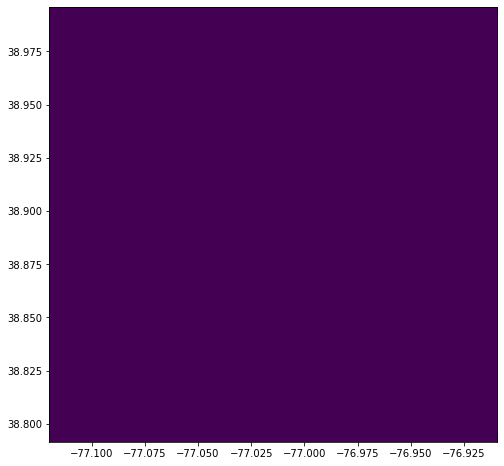

<AxesSubplot:>

In [83]:
# Reading in the predictions of the second model
fpp = r'./data/dc_income_predicted2.tif'
imgp = rio.open(fpp)
plt.figure(figsize=(12,8))
show(imgp, )